:::{index} single: Report writing
:::
:::{index} single: Simulations; Report writing
:::
:::{index} single: Scenarios; Report writing
:::
:::{index} single: Simulations; the keep option
:::

:::{index} single: Scenarios; the Keep option
:::

:::{index} single: Keep; the Keep option to retain scenario results
:::



In [1]:
#This is code to manage dependencies if the notebook is executed in the google colab cloud service
if 'google.colab' in str(get_ipython()):
  import os
  os.system('apt -qqq install graphviz')
  os.system('pip -qqq install ModelFlowIb ipysheet  --no-dependencies ')


In [2]:
# Prepare the notebook for use of modelflow 

# Jupyter magic command to improve the display of charts in the Notebook
%matplotlib inline

# Import pandas 
import pandas as pd

# Import the model class from the modelclass module 
from modelclass import model 

# functions that improve rendering of modelflow outputs
model.widescreen()
model.scroll_off();

<IPython.core.display.Javascript object>

# Report writing and scenario results

`ModelFlow`, standard pandas routines and other python libraries like [matplotlib](https://matplotlib.org/), [seaborn](https://seaborn.pydata.org/), [plotly](https://plotly.com/), and [bokeh](https://bokeh.org/). These libraries are well-integrated with dataframes, offering seamless interaction. These packages can be used to visualize and compare dataframes generated by a model and therefore the results from scenarios -- as indeed has been done in the preceding chapter. 

While users are free to employ any Python-based library for visualization purposes, ModelFlow furnishes a suite of functions that build on the above packages (mainly mathplotlib), but also understand  modelflow internal data structures. Moroever, they are tailored to utilize modelflow metadata such as variable descriptions and include specific transformations (like growth rates) that are useful in the analysis of macroeconomic model results.


## Load model object and simulation results from Scenario Analysis Chapter
To begin, we load the solution file that was saved at the end of the previous chapter, using the by now familiar modelload function.  Because the simulations performed in the previous chapter used the keep option, and because we saved the `mpakwScenarios.pcim` file with the keep option set to true, we will have access to all the simulation results from the previous chapter.

In [3]:
mpak,_ = model.modelload(r'..\models\mpakwScenarios.pcim', run=True)
mpak.smpl(2020,2040);

file read:  C:\mflow\papers\mfbook\content\models\mpakwScenarios.pcim


:::{index} single: Tables
:::

## Table routines

### Display levels 

If we pass mnemonics to the model object we will get the value of the variable(s) for the time periods set in the global sample. By default the values are from the latest solution.

:::{index} single: Tables; Display levels
:::

In [4]:
mpak.smpl(2023,2027) # Change global sample period to restrict output
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].df

,PAKNYGDPMKTPKN,PAKNECONPRVTKN
2023,2.696308e+07,2.442786e+07
2024,2.739320e+07,2.481852e+07
2025,2.796323e+07,2.532326e+07
2026,2.864038e+07,2.590981e+07
2027,2.939676e+07,2.655299e+07


Alternatively we could have a larger global sample period and use with set_smpl(begin,end) to show the values of ashorter time period.

In [5]:
mpak.smpl(2023,2027) # Change global sample period to 2000 2100
with mpak.set_smpl(2023, 2027):
    print(mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].df);

      PAKNYGDPMKTPKN  PAKNECONPRVTKN
2023    2.696308e+07    2.442786e+07
2024    2.739320e+07    2.481852e+07
2025    2.796323e+07    2.532326e+07
2026    2.864038e+07    2.590981e+07
2027    2.939676e+07    2.655299e+07


Patterns can or other search parameters can be used to specify the variables to be displayed.

In [6]:
with mpak.set_smpl(2023, 2027):
    print(mpak['*NYGDPMKTP?N'].df)

      PAKNYGDPMKTPCN  PAKNYGDPMKTPKN  PAKNYGDPMKTPXN
2023    6.259407e+07    2.696308e+07        2.321473
2024    6.852862e+07    2.739320e+07        2.501665
2025    7.484111e+07    2.796323e+07        2.676411
2026    8.153469e+07    2.864038e+07        2.846843
2027    8.860694e+07    2.939676e+07        3.014174


If you want to look at some data from outside the current time period. you can use the dataframe and the .loc syntax. But note that this is using the dataframe 'res; where the results were placed, not the model object: 'mpak'.

In [7]:
mpak.lastdf.loc['2016':'2022','PAKNYGDPMKTPKN']

2016    2.279670e+07
2017    2.421843e+07
2018    2.461013e+07
2019    2.576058e+07
2020    2.627394e+07
2021    2.651137e+07
2022    2.668514e+07
Name: PAKNYGDPMKTPKN, dtype: float64

:::{index} single: Tables; Display growth rates
:::

### Display growth rates

The growth rate of series can be displayed using standard pandas routines or using modelflow.  Note that in the modelflow representation the growth rate for the first year is displayed whereas in the pandas routine it is not.  This is because modelflow will look for lagged values outside of the active sample period, while pandas does not.

In [8]:
with mpak.set_smpl(2023, 2027):
    #Standard pandas way
    print(mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].df.pct_change()*100);
    #Modelflow way
    print(mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].pct.mul100.df);

      PAKNYGDPMKTPKN  PAKNECONPRVTKN
2023             NaN             NaN
2024        1.595229        1.599245
2025        2.080922        2.033686
2026        2.421581        2.316270
2027        2.640940        2.482370
      PAKNYGDPMKTPKN  PAKNECONPRVTKN
2023        1.041537        1.091432
2024        1.595229        1.599245
2025        2.080922        2.033686
2026        2.421581        2.316270
2027        2.640940        2.482370


:::{index} single: Tables; Display percent change from baseline
:::

### Display percent change from baseline

The modelflow methods `.difpct` and `.mul100` can be used together to create and show a dataframe showing the percent change in a variable between the baseline and simulated scenarios.

In [9]:
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].difpct.mul100.df  # difference in growth rates

,PAKNYGDPMKTPKN,PAKNECONPRVTKN
2023,0.0,0.0
2024,0.0,0.0
2025,0.0,0.0
2026,0.0,0.0
2027,0.0,0.0


In [10]:
:::{index} single: Tables; Change display format temporarily
:::

SyntaxError: invalid syntax (1617781722.py, line 1)

### Change the format of outputs

In the preceding examples the formatting of outputs followed what ever the global pandas setting was.  This can be changed either permanently or using a with statement.

In [ ]:
with pd.option_context('display.float_format', '{:,.2f}'.format):
    with mpak.set_smpl(2023, 2027):
        print(mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].pct.mul100.df);
    

Alternatively one can use the formatted `f'` syntax and have one variable with one decimal places option and the second with a different one.



In [ ]:
:::{index} single: Tables; Change display format globally
:::

or the format can be changed globally
```pd.options.display.float_format = '{:.1f}'.format```.

## Graphics routines

`ModelFlow`, standard pandas routines and other python libraries like [matplotlib](https://matplotlib.org/), [seaborn](https://seaborn.pydata.org/), [plotly](https://plotly.com/), and [bokeh](https://bokeh.org/). These libraries are well-integrated with dataframes, offering seamless interaction. These packages can be used to visualize and compare dataframes generated by a model and therefore the results from scenarios -- as indeed has been done in the preceding chapter. 

While users are free to employ any Python-based library for visualization purposes, ModelFlow furnishes a suite of functions that build encapsulate the functionality of he above packages (mainly mathplotlib), but also understand  modelflow internal data structures such as variable descriptions and include specific transformations (like growth rates) that are useful in the analysis and presentation of macroeconomic data and simulation results.


1. Plot one or more series from a single dataframe
2. Plot one series from two (or more) dataframes, notably the .basedf and .lastdf dataframes
3. Compare results for one or more series from the most recent simulation
    - in levels
    - differences in growth rates
    - Percent deviations from baseline levels



### Plot one or more series from a single dataframe

Modelflow encapsulates standard mathplotlib routines to allow you to select a series from a modelobject and graph it a range of formats.

#### as a level

In [ ]:
mpak.smpl(2020,2050)
import pandas as pd
pd.options.display.float_format = '{:.1f}'.format
_ = mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].plot(kind='line',title='Levels real',colrow=1,top=0.8);




### as a growth rate
Note the temporary change to the formatting of floats for this graph only.

In [ ]:
mpak['PAKNYGDPMKTPKN'].pct.mul100.plot(kind='line',title='Real GDP - Percent growth',colrow=1); #colrow options ensures the chart uses all of the available space


In this example the selector returns two series and the plot call generates one graph for each series.

In [ ]:
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEGDIFTOTKN'].pct.\
    mul100.plot(kind='line',title='Components of GDP ',colrow=1,top=0.8); 

:::{index} single: Modelflow; Chart routines - simulations
:::
:::{index} single: Simulations; Chart routines
:::


### Charts comparing simulation results

Recall that the model object includes both a `.basedf` dataframe with the value of variables in the baseline as well as a `.lastdf` dataframe that contains the results from the most recent simulation.

Modeflow includes routines to display graphically the change in variables across scenarios.

#### First lets run a simulation


In [ ]:
# Load and solve the model
mpak.smpl(2010,2100)
mpak,result = model.modelload('../models/pak.pcim',run=1,silent=1)

#run a solution using the revised model and replacing the dataframe with the new one (exostart)  (that includes the exogenized variables) with their values.  Store thre results in a dataframecalled Baseline
# they will also be stored in mpak.latestdf

mpak.basedf = result.copy() 

scenarios = {'Carbon tax on Coal (USD/Ton)':'PAKGGREVCO2CER',
               'Carbon tax on Oil (USD/Ton' :'PAKGGREVCO2OER',
               'Carbon tax on Natural Gas (USD/Ton' :'PAKGGREVCO2GER'}
value = 29

alternative_exo = result.copy() #makes a copy of the dataset

for tax,var in scenarios.items():
        alternative_exo.loc[2020:2100,var] = value  # sets the carbon tax on all three products to value (29)
     
        
res= mpak(alternative_exo,2020,2100,alfa = 0.7,silent=1,solver = 'sim',relconv = 0.00000001) #runs the solutiona nd saves it with the name to teh left

### Compare results from lastest and baseline simulation

:::{index} single: Simulations; Chart routines - change in levels
:::

#### Change in the levels

The combination of the `.dif` and `.plot()` methods will generate a graph showing the change in the level of the variables equested

In [ ]:
pd.options.display.float_format = '{:.1f}'.format
mpak['PAKNYGDPMKTPKN'].dif.plot(kind='line',\
                                title='Real GDP - change in levels',colrow=1,top=0.8);

:::{index} single: Simulations; Chart routines - change in growth rate
:::

#### Change in the growth rates of variables

The combination of the `.difpct`, `.mul100` and `.plot()` methods will generate a graph showing the change in growth rate of the variables selected. If more than one variable is selected, each change in growth rate will appear in a separate figure.

In [ ]:
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN '].difpct.mul100.plot(kind='line',\
                    title='Change in real growth rates',colrow=1,top=0.8);

:::{index} single: Simulations; Chart routines - change in growth rate
:::

#### Change in the levels expressed as a percent of GDP 

The combination of the `.difpctlevel`, `.mul100` and `.plot()` methods will generate a graph showing the change in the level of the variables selected expressed as a % of the baseline (often referred to as an impulse response function). If more than one variable is selected, each impulse response function  will appear in a separate figure.

In [ ]:
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN '].difpctlevel.mul100.plot(kind='line',\
                    title='Change in the level expressed as a percent of baseline',colrow=1,top=0.8);

### Show baseline and simyulation results side by side on the same graph

The `.plot_alt` method compares the levels or growth rates of a variable across the most recent and baseline scenarios.

In [ ]:
with mpak.set_smpl(2020,2040):
    mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].plot_alt("Levels, baseline versus scenario") ;

### Plot multiple series from different scenarios

Modelflow does not provide an out-of-the box way to compare multiple series from different scenarios, but this can be done with `mathplotlib` routines. In the example below the lines to be plotted are specified in separate `plt.plot` commands. In the first case, the line plotted is the result of a calculation done on the fly, while in the second a single variable is used.

In [ ]:
import matplotlib.pyplot as plt

base = mpak.basedf
alt = mpak.lastdf
plt.plot(mpak.basedf.loc[2010:2050,'PAKGGBALOVRLCN']/mpak.basedf.loc[2010:2050,'PAKNYGDPMKTPCN']*100,label='Baseline')
plt.plot(mpak.lastdf.loc[2010:2050,'PAKGGBALOVRLCN_'],label='Carbon Tax scenario')
  
# set y label
plt.ylabel('% of GDP')
  
# set x label
plt.xlabel('Time')
plt.legend()  
# set title
plt.title('Overall Fiscal balance')
  
# display plot
plt.show()


:::{index} single:Charts; multiple charts in one figure
:::
:::{index} single:Charts; Compare levels from different scenarios on one chart
:::            
:::{index} single:Charts; Mathplotlib examples with ModelFlow
:::            
:::{index} single:Mathplotlib; examples with ModelFlow
:::            

### Graphic routines for "kept" solutions

The **Keep** option facilitates the comparison of results from different scenarios run on a give model object.  In each of the simulations executed in the previous chapter, the `keep` option was activated. This caused the results from each simulation to be stored in the model object in a `DataFrame` that can be identified by the descriptor given to it.  

#### Keep_solutions
The various scenarios that have been saved in a model object are stored in a dictionary of dataframes called keep_solutions, with the keys in the dictionary being the text "names" associated with the results dataframe when the keep command was executed.  To extract a list of kept solutions, one needs to display the keys of the keep_solutions dictionary.

:::{index} single:keep option; keep_solutions
:::    
:::{index} single:keep option; keep_solutions.keys() display names of kept solutions
:::    

In [ ]:
mpak.keep_solutions.keys()  

or perhaps more easily read with:



In [ ]:
:::index single: keep_solutions; List stored solutions
:::
:::index single: keep_solutions; Extract dataframe from kept solutions
:::
                                

In [ ]:
for  key,value in mpak.keep_solutions.items():
    print(key)
    
    

The dataframes stores by the dictionary of kept solutions can be copied into temporary dataframes either for reporting purposes or in order to build a second solution on top of an initial one.

In the example below, the original baseline dataframe is assigned to a new variable oldbline and the results from the first scenario (a 25$ kike in the price of crude oil) are assigned to red_oil.  Finally the change in the for GDP are expressed as a percent of the baseline GDP over the period 2024 and 2030

In [ ]:
oldbline=mpak.keep_solutions['Baseline']
resoil=mpak.keep_solutions['$25 increase in oil prices 2025-27']

print(round((resoil.loc[2024:2030,'PAKNYGDPMKTPKN']/oldbline.loc[2024:2030,'PAKNYGDPMKTPKN']-1)*100,2))

### The keep_variables option
By default all variables are kept, if the user wishes to restrict the kept variables to a sub-set, they can do so by setting the **keep_variables** when the simulation is run, where 

For example:

```mpak(CTempExogAllKG,2020,2040,keep='2.5% increase in C 2025-27 -- exog whole period --KG=True',keep_variables='PAKNYGDPMKTPKN PAKNE*KN PAKEM*') ```

would run a simulation between 2020 AND 2040 CALLED 2.**5% increase in C 2025-27 -- exog whole period --KG=True** but keep only the variables that matched the search string in keep_variables.

By the same token, any search criteria could be used to define the set of keep_variables, for example:

`keep_variables='#MyGroup'` would cause the system to retain the variables designated in that group, or
`keep_variables='!*invest*'` would cause the system to retain the variables whose descriptions matched the search string *invest*.

Thus if you had specific interest in say real GDP, the current account balance and the government deficit, you might define a new Group say ReportVars as below:


In [ ]:
mpak.var_groups['ReportVars']="PAKNYGDPMKTPKN PAKBNCABFUNDCD_ PAKGGBALOVRLCN_"


You could then store the results for these variables of interest only, by executing scenarios with `keep_variables='#ReportVars'` option set.

:::{index} single: Simulations; Report-writing - the keep_plot method
:::
:::{index} single: Scenarios; Report-writing - the keep_plot method
:::
:::{index} single: Keep_solution dictionary
:::
:::{index} pair: Keep_solution; keep_variables
:::





#### The `.keep_plot()` method

The keep_plot method can be used to plot and compare results from the various scenarios that had been run earlier using the `keep=` option. 


First lets reload the results from the simulations done in the preceding chapter where we used the keep option to save in the model object the results of a number of simulations.  The results of each of those simulations can be accessed by loading the saved file that was saves earlier.


In [ ]:
mpak,_ = model.modelload(r'..\models\mpakwScenarios.pcim', run=True)
mpak.smpl(2020,2040);

By default the results across all scenarios for each selected variables will be shown on one chart at a time (`keepdim=true`).  NB: the 2020,2040 restricts output to the period 2020 2040 the period over which the shocks were run.  Without that the graphs would display for the whole time period defined in the `model object` `mpak`.

By default each series returned by the selector (three in this instances) is rendered in a separate graph that compares results across **kept** scenarios.


In [ ]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN',2020,2040,  legend=True,diffpct=True);
#show for each variable on a separate chart the results from each kept scenario

:::{index} single: Scenarios; report-writing - keep_plot options
:::
:::{index} single: Simulations; report-writing - keep_plot options
:::
:::{index} single: Keep_plot; options
:::



#### `keep_plot()` options


|options|arguments|example(s)|Explanation|
|:--|:--|:--|:--|
|variables|list of variable mnemonics or search critiera|variables='PAKNE\*KN'; variables='#MyGroup'; variables='PAKNYGDPMKTPKN PAKNECONPRVTKN'|Defines the variables to be retained after the simulation|
|start, end|a date|start=2020;end=2040| Restricts output to the time-period indicated|
|showtype|'level';'growth';'change' | showtype="growth";showtype="level";showtype="dif" | Displays the plot using the level, growth rate or change in the level of the variable|
|legend|True, False|Legend=True| True:Legend placed inside the graph; False: Legend follows graph  |
| diff |True; False (default) |True: graphs are expressed as the difference with respect to the first scenario in the kept library|
| diffpct |True; False (default) |True: graphs are expressed as the percent difference **with respect to the first scenario in the kept Library**|
| savefig|savfig='..charts/figure17.jpg'|The extension determiens thefile format of the saved file: ```pdf```, ```svg``` and ```png``` are the most common extensions.| Creates one file for each figure generated by the command.|
 
 
 **Other parameters**
 
 | Parameter       | Type            | Description                                                                                      |
|:-----------------|:-----------------|:--------------------------------------------------------------------------------------------------|
| `pat`           | string          | Pattern for variable selection. Defaults to '*'.   (same effect as \['pattern'\] |
| `start`         | TYPE            | Start period for the plot. Defaults to ''.                                                        |
| `end`           | TYPE            | End period for the plot. Defaults to ''.                                                          |
| `start_ofset`   | int             | Relative offset for the start period from the current period. Defaults to 0.                      |
| `end_ofset`     | int             | Relative offset for the end period from the current period. Defaults to 0.                        |
| `mul`           | float           | Multiplier for the data. Defaults to 1.0.                                                         |
| `title`         | str            | Title for the plot. Defaults to 'Show variables'.                                                 |
| `legend`        | bool            | If False, explanations are displayed to the right of the curve. Defaults to True.                 |
| `scale`         | str            | Scale of the plot ('log' or 'linear'). Defaults to 'linear'.                                      |
| `yunit`         | str            | Units for the y-axis. Defaults to ''.                                                             |
| `ylabel`        | str            | Label for the y-axis. Defaults to ''.                                                             |
| `dec`           | TYPE            | Number of decimals to display, automated if ''. Defaults to ''.                                   |
| `trans`         | dict            | Translation dictionary for variable names. Defaults to {}.                                        |
| `showfig`       | bool            | If False, the figure is not displayed. Defaults to True.                                          |
| `vline`         | list of tuples  | List of (time, text) for vertical lines on the plot. To erase, delete `model.vline`.              |
| `savefig`       | string          | Folder to save figures in, creates the folder if needed.                                          |
| `keep_dim`      | bool            | If True, each line represents a scenario; if False, each line represents a variable. Defaults to True. |
| `dataonly`      | bool            | If True, only the resulting data frames are returned, no plot is shown. Defaults to False.        |

 :::{note}
`'keep_plot()` and `.keep_plot_multi()` return a python object that points to the in memory version of the rendered figure(s).  This object can be used to modify the graph (see examples towards the end of this chapter).
 
 :::
 
:::{index} single: Keep_plot; savefig 
::: 
 
 

:::{index} single: Scenarios: Keep_plot examples - the diff option
:::
:::{index} single: Simulations: Keep_plot examples - the diff option
:::
:::{index} single: Keep_plot; examples - the diff option
:::

##### An example using the diff=True option

When `diff=True` (or 1) results from all kept scenarios will be presented as the level change in selected variables **with respect to the first scenario** in the keep list. -- in this instance the scenario saved with the name `baseline` (for memory these are stored in the dictionrary keep_solutions and can be visualized with the code snippet below).  

```
for  key,value in mpak.keep_solutions.items():
    print(key)
```

:::{warning}
Note in this instance `baseline` and `basedf` are the same because they were defined that way.  However, there is nothing in the system that guarantees that the first `keep` scenario will be the baseline or the `basedf` scenario.
:::

In [ ]:
#Set the default period for the mpak object to 2020 2040
# because of this future calls to keep_plot or anyother model objkect method
# will operate over the period 2020 2040 only.
mpak.smpl(2020,2040) 
mpak.keep_plot('PAKNYGDPMKTPCN PAKNEIMPGNFSKN', diff=1, legend=True);

:::{index} single: Scenarios; Keep_plot examples - showtype=growth
:::
:::{index} single: Simulations; Keep_plot examples - showtype=growth
:::
:::{index} single: Keep_plot; examples - showtype=growth
:::

##### The `showtype` option

In this example the difference with respect first `'keep` scenario `baseline` values are once again shown. This time the `showtype` option has been set to `growth`.  As a result the data is displayed as the  difference in the growth rates between the simulation scenarios and the growth rate in the `baseline` scenario -- remembering that keep_plot is calculating the differences with respect to the first kept scenario. Its name need not have been baseline, this was just a decision made in preparing the shocks that facilitated the kind of comparisons to be displayed. 

In [ ]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNEIMPGNFSKN', diff=1,showtype='growth', legend=True);


:::{index} single: Scenarios; Keep_plot examples - showtype=diffpct
:::
:::{index} single: Simulations; Keep_plot examples - showtype=diffpct
:::
:::{index} single: Keep_plot; examples - showtype=diffpct
:::



##### The diffpct option

Setting `diffpct=True` instructs `.keep_plot()` to display the data as a percent deviation from the first `kept` scenario, which in this case was the baseline scenario.
$\big(\frac{x_{shock}-x_{original}}{x_{shock}}\big) * 100$

In [ ]:
mpak.keep_plot('PAKNYGDPMKTPCN  PAKNEIMPGNFSKN', diffpct=True,showtype='level',legend="Change in level as a % of first keep scenario");




:::{index} single: keep_solutions.keys()
:::
:::{index} single: Simulations; keep_plot options -- keep_switch -- specify the kept scenarios to be displayed
:::
:::{index} single: Compare solutions; keep_plot options -- keep_switch -- specify the kept scenarios to be displayed
:::

:::{index} single: keep_plot options; keep_switch -- specify the kept scenarios to be displayed
:::


#### The `.keep_switch()` method

The `.keep_switch()` method restricts the number of scenarios on which subsequent calls to `.keep_plot()` (and `.keep_plot_multi()`) are executed on.  `.keep_switch()` can be passed a list of scenarios or using a wildcard selector.

##### The `.keep_solutions.keys()` method 
The `.keep_solutions.keys()` method displays a list of the solutions that have been kept previously.

In [ ]:
mpak.keep_solutions.keys()


To specify exactly which scenarios to show in a keep_plot, the `scenarios=` option of `.keepswitch()` must be initialized with a "|" delimited string of the names of the scenarios (retrieved above) that are to be displayed.

By placing the `.keepswitch()` in a `with` clause the scenario restriction will only apply to indented lines that follow the with construct.

As before the scenarios are compared with the first scenario in the keep dictionary, which in this instance happens to be named 'baseline'.

In [ ]:

with mpak.keepswitch(scenarios='2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whole period|2.5% increase in C 2025-27 -- exog whole period --KG=True|2.5% increase in C 2025-27 -- temporarily exogenized'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN PAKGGDEBTTOTLCN',start=2020,end=2040,diff=False,showtype='growth',legend=True);

:::{index} single: keep_plot; keep_dim option
:::
:::{index} single: keep_plot; keep_dim=False
:::
:::{index} single: Simulations; Graphical comparison of solutions ordered by variable
:::
:::{index} single: scenarios; Graphical comparison of solutions ordered by variable
:::



##### keep_plot with keep_dim=False

When Keep_dim is set to False keep_plot shows all pf the selected variables for each scenario on a single chart (rather than the default behavior of the results for each variable across  the various scenarios on one plot.

In [ ]:

with mpak.keepswitch(scenarios='2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whole period'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN PAKGGDBTTOTLCN',start=2020,end=2040,diff=False,showtype='growth',legend=True,keep_dim=False);

:::{index} single: keep_switch; selection using wildcard
:::
:::{index} single: Simulations; Compare solutions - keep_switch with wildcard
:::
:::{index} single: Scenarios; Compare solutions - keep_switch with wildcard
:::



##### The `.keep_solutions.keys()` method with diff=True

If .keep_plot() is called on a sub-set of the kept solutions, the comparison will be made relative to the first scenario in the .keep_switch call.

Thus in the example below (which repeats the previous call, but sets diff=True, all of the shocks are calculated relative to the shock named '2.5% increase in C 2025-40'.  Thus there are only three lines (not four as when diff=False).



In [ ]:

with mpak.keepswitch(scenarios='2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whole period|2.5% increase in C 2025-27 -- exog whole period --KG=True|2.5% increase in C 2025-27 -- temporarily exogenized'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN ',start=2020,end=2040,diff=True,showtype='growth',legend=True);

If, as before, the objective was to compare the four scenarios with the baseline scenario, the baseline scenario would have to be added to the .keep_switch() call as below:



In [ ]:

with mpak.keepswitch(scenarios='baseline|2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whole period|2.5% increase in C 2025-27 -- exog whole period --KG=True|2.5% increase in C 2025-27 -- temporarily exogenized'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN PAKGGDBTTOTLCN',start=2020,end=2040,diff=True,showtype='growth',legend=True);

:::{warning} .keep_switch() and .keep_plot() with option diff=True

When the .keep_plot() option diff is set to True, the figures will be generated as comparisons with the values of the first scenario specified in the .keep_switch() command.  In most instances users will want to use the baseline scenario as this comparison point.  Failure to do so when this was the intention/expectation of the user, will generate unexpected results.

:::

:::{index} single: keep_switch; selection using wildcard
:::
:::{index} single: Simulations; Compare solutions - keep_switch with wildcard
:::
:::{index} single: Scenarios; Compare solutions - keep_switch with wildcard
:::



#### Keepswitch with wildcard selection

Below a series of plots are generated using a wildcard selector in the keepswitch clause.

In [ ]:

with mpak.keepswitch(scenarios='*2025*'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKNECONPRVTKN',showtype='growth',legend=True,start=2020,end=2040);

:::{index} single: Simulations; Report-writing keep_plot_multi - comparison of scenario results impacts on multiple series
:::
:::{index} single: Simulations; Compare solutions - comparison of scenario results impacts on multiple series
:::
:::{index} single: Scenarios; Report-writing keep_plot_multi - comparison of scenario results impacts on multiple series
:::
:::{index} single: Scenarios; Compare solutions - comparison of scenario results impacts on multiple series
:::
:::{index} single: Report-writing; .keep_plot_multi - comparison of scenario results impacts on multiple series
:::
:::{index} single:keep_plot_multi; comparison of scenario results impacts on multiple series
:::



#### The `.keep_plot_multi()` method

The `.keep_plot_multi()` method allows several charts to be displayed in a grid.  The size of each chart can be set with the `size=(w,h)` option, where the units of width and height are in **centimetres**.  This call differs from .keep_plot() by displaying the difference of multiple variables from one scenario versus the initial scenario. In contrast, the graphs generated by .keep_plot() shows all scenarios for just one variable. 

:::{note} .Keep_plot vs .keep_plot_multi()

Both  .Keep_plot and .keep_plot_multi() display multiple graphs comparing results for one or more variables.

| Method | nature of displayed lines |
|:---|:---|
|.keep_plot()|One graph per series displayed, multiple scenarios on each graph|
|.keep_plot_multi()|Many different variables displayed on each graph, each emanating from a different scenario|

:::

### Modifying figure objects

As indicated earlier both `keep_plot()` and `keep_plot_multi()` return a variable (a grid of mathplot figure objects) that can be used to embellish or modify the figures produced by the automatic routines.

The command

``` 
var_figs = mpak.keep_plot_multi('PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEGDIFTOTKN PAKNEIMPGNFSKN PAKNEEXPGNFSKN',2010,2040,keep_dim=0,
            legend=1,size=(20,20) ,diffpct=True,title='Scenario Comparison'  );
```

returns several figures placed into a grid, which in this case is assigned to a pytyhon object var_figs.  This contains a matrix (grid) of mathplotlib figures can then be manipulated using standard mathplotlib commands.



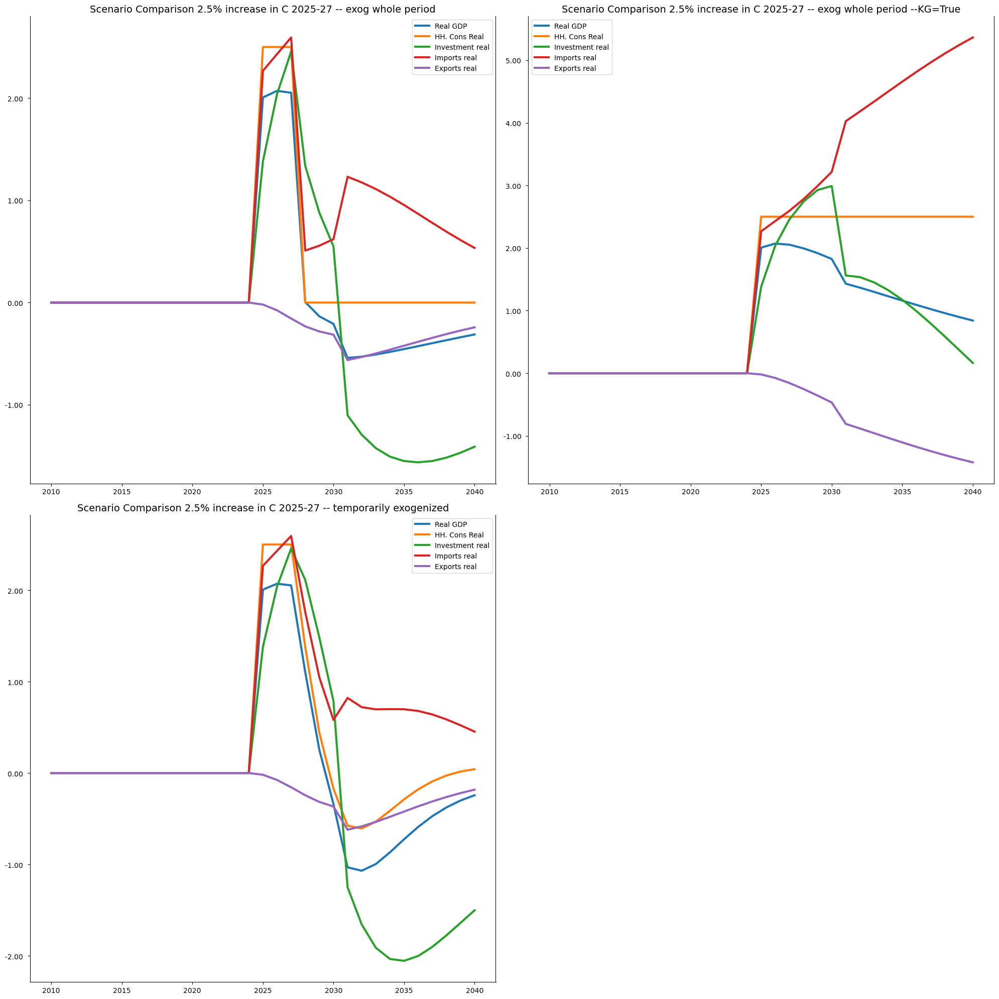

In [13]:
with mpak.set_smpl(2000,2040):
    with mpak.keepswitch(scenarios="baseline *exog*"):
        var_figs = mpak.keep_plot_multi('PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEGDIFTOTKN PAKNEIMPGNFSKN PAKNEEXPGNFSKN',2010,2040,keep_dim=0,legend=1
                                ,size=(20,20) ,diffpct=True,title='Scenario Comparison'  );

:::{index} single: Graphs; Modify size of already generated figures
:::

##### Change the size of charts



In [14]:
var_figs.set_size_inches(5,5)
var_figs

AttributeError: 'dict' object has no attribute 'set_size_inches'

Individual charts can be deleted from the grid.  

:::{note}
The grid representation of the individual charts is returned as a 0-based vector of charts.  Thus the first figure is the zeroeth and the second is the first.
:::

:::{index} single: Mathplotlib; plots - Delete figure from grid of charts 
:::
:::{index} single: Report-writing; Delete figure from grid of charts (mathplotlib functionality)
:::



### Delete a chart from the grid

A chart can be deleted from the grid by referencing it and calling the `.remove()` method. 

In this example the second chart (index number 1) has been removed.

In [ ]:
var_figs.axes[1].remove()
var_figs

The same mechanism can be used to revise the titles of the indidividual charts and annotate them.

In [ ]:
var_figs.axes[0].set_title('Impact of a 2.5% increase in C using exog method');    # many properties can be set afterward 
var_figs.axes[1].set_title('Impact of a 2.5% increase in C using temporary exog method');
var_figs

:::{index} single: Mathplotlib; revise charts after built
:::




In [ ]:
var_figs.axes[0].set_xlabel('Year')
var_figs.axes[0].set_ylabel('Change percent\nchange in level',fontsize=10)
var_figs.axes[0].yaxis.set_label_coords(-0.1,1.02)
var_figs.axes[0].xaxis.set_label_coords(.95,-.06)
var_figs

Variables pointing to the individual charts can be defined and used to make modifications to individual charts within the overall figure.



In [ ]:
#del fig1
#del fig2
fig1=var_figs.axes[0]
fig2=var_figs.axes[1]


In [ ]:
fig2.set_ylabel('Percent change\nin level',fontsize=10)
fig2.yaxis.set_label_coords(-0.1,1.02) #place axes labels
fig2.xaxis.set_label_coords(.95,-.06)



fig2.text(2030.,1.4, 'Some text in a box', 
          color='yellow',bbox=dict(facecolor='red', alpha=0.5));
fig2.text(2035.,-1., 'More text', 
          style='italic',color='green');
          
var_figs
          

:::{index} single: Graphs; save mathoplotlib figure to file
:::
:::{index} single: Figures; save as PNG
:::
:::{index} single: Figures; save as SVG
:::
:::{index} single: Figures; save as JPG
:::
:::{index} single: Figures; save as PDF
:::

In [ ]:
fig.savefig='Level.svg' 
fig.savefig='Level.png'
fig.savefig='Level.jpg'
fig.savefig='Level.pdf'

## Interactive widgets

Modelflow funning in a Jupyter Notebook includes two interactive widgets that reproduce much of the functionality described above.  

The main widget pertains to all modelflow model objects and is called 

```
mpak['#National expenditure accounts'] #display a widget for all the variables defined in the headline group

or
mpak['PAK*EMIS*'] #display a widget of all the emission variables
```

The widget by definition will show tables and graphs for the value and growth rates of the requested variables from both the `.basedf` and `.latestdf` and latest, as well as their differences, differences in growth rates, pecent change in levels/

In [ ]:
mpak['#National expenditure accounts']



:::{index} single: keep_show(); interactive keep_plot
:::

### `.keep_show()` Interactive widget for keep_plot 

The .keep_show() method does preapres similar outputs for simulations that have been stored via the `keep` option. 

```.keep_show()```

This will show a interactive widget which allows  the user to design scenario charts as shown below.  

In [ ]:
mpak.keep_show(legend=1) 

:::{image} keep_show_1.png
    :alt: Menu to start notebooks in subfolders
    :class: bg-primary mb-1
    :width: 90%
    :align: center
:::   

:::{index} single: keep_show(); save chart to file
:::

### Save charts to file. 
When the `Allow save to file` checkbox is checked, an additional widget is displayed. This can be used to save the charts in a number of formats. As a default the charts are saved in `graph/experiment name`.  

### savefig method

The savfig method is a standard mathplotlib method that can be used to sabe a figure using a range of different formats.

:::{image} keep_show_file_save.png
    :alt: Menu to start notebooks in subfolders
    :class: bg-primary mb-1
    :width: 90%
    :align: center
:::   

### Settings 
There are a number of settings which allows the user to customize the inputs required by  the widget. 

| Parameter          | Type          | Description                                                                                       |
|--------------------|---------------|---------------------------------------------------------------------------------------------------|
| `smpl`             | Tuple         | The selected sample, a tuple with 2 elements, matching the dataframe index. Defaults to ('','').  |
| `use_smpl`         | False         | Show a sample selection slider.                                                                    |
| `selectfrom`       | List          | The variables to select from. Defaults to [] (all kept variables).                                |
| `legend`           | False          | Show legends or to the right of the curve.                                    |
| `dec`              | String        | Decimals on the y-axis. Defaults to '0'.                                                           |
| `use_descriptions` | True          | Use the variable descriptions from the model.                                                      |
| `vline`            | List          | List of vertical lines (position, text).                                                           |
| `add_var_name`     | False          | Add the variable name to description.                                                              |
| `short`            | 0, 1 or 2     | Short, 1 or 2 cut down on the input fields.                                                        |
| `select_scenario`  |True          | Allow selection of scenarios for which charts are displayed.                                                   |
| `switch`           | False          | Use the scenarios in `mmodel.basedf` and `mmodel.lastdf`.                                          |
| `var_groups`       | Dict          | A dictionary of variable patterns to select, e.g., countries.                                      |
| `use_var_groups`   | True          | Use the `var_groups`.                                                                              |
| `displaytype`      | String        | Display type, one of ['tab', 'accordion', 'anything'].                                             |
| `save_location`    | String        | Default save location.                                                                             |
| `relativ_start`    | Int           | Relative start.                                                                                    |
| `selected`         | String        | Selected item.                                                                                     |
| `select_width`     | String        | Width of the selection widget.                                                                     |
| `select_height`    | String        | Height of the selection widget.                                                                    |


### .keep_show() call with options
The following shows a call when the most used options has been set explicitly. If a parameter is not set explicitly the default will be used.

In [82]:
mpak.keep_show(
select_scenario = True,  # default = False, allow selection of scenarios to display 
use_smpl        = True,  # default = False, allow selection of display smpl 
use_descriptions= True, # default = True,  use descriptions from model  
add_var_name    = False, # default = False, add variable name to description
switch          = False, # default = False, use basedf and lastdf as scenarios
use_var_groups  = True,  # default = True, show selection menu based on var_groups 
var_groups      = mpak.var_groups,  # default = .var_groups Grouping of variable to be used.
selectfrom     = 'PAK*',  # default = '*' Select variables  
legend         = True, # Default= False show legend     
)